# Assignment 8: Explainable Machine Learing (Part 1)

## Objective:

Interpreting how a machine learning model works is crucial from many aspects, such as debugging the model, improving the model, and derive new insights from the model. There are many model explanation techniques that we can use for interpreting a black box model itself or its predictions. Also, some models are transparent that we can directly get insights from its structure or learned parameters. In this assignment, you are going to train different models on a dataset and try different approaches to explain the model and get some insights. After completing this assignment, you should be able to answer the following questions:

1. How to explain transparent models?
2. How to implement the permutation method to explain black-box models?
3. How to create and interpret partial dependence plots?
4. How to implement the global surrogate method to explain black-box models?
5. How to use SHAP to explain model predictions and interpret its explanation results? 
6. How to use LIME to explain model predictions and  interpret its explanation results? 

The data can be downloaded from [A8-1-data.zip](A8-1-data.zip)



## 0. Preparation

Import relevant libraries and load the dataset:

In [1]:
%matplotlib inline
import zipfile
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from dataprep.eda import plot

from sklearn.model_selection import train_test_split
from sklearn.inspection import PartialDependenceDisplay
from sklearn.inspection import partial_dependence
from sklearn.inspection import permutation_importance
from sklearn.metrics import log_loss
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier

The dataset we are going to use is a binary forest covertype dataset and we will predict the forest cover type from cartographic variables only. The first ten features are numerical features, there are also two categorical features in a one-hot encoding fashion (4 and 40 vector length each), the last column is the target forest cover type (binary). More details about the dataset can be found at [https://archive.ics.uci.edu/ml/datasets/covertype](https://archive.ics.uci.edu/ml/datasets/covertype). Please make sure you understand the meaning of each feature.

  0%|                                                                                                         …


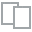
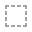
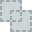
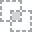
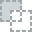
...
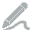
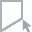
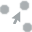
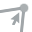
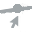

In [2]:
# load data and take a look at data distribution
data = pd.read_csv('bforest_sample.csv', delimiter=',')
plot(data)

In [3]:
# split data into training and test dataset with respect to ratio 0.8:0.2
train, test = train_test_split(data, test_size=0.2, random_state=733)
X_train, y_train = train.iloc[:, :-1], train.iloc[:, -1]
X_test, y_test = test.iloc[:, :-1], test.iloc[:, -1]
feature_names = list(X_train)

# rescale
scaler = MinMaxScaler()
X_train = pd.DataFrame(data=scaler.fit_transform(X_train), columns=feature_names)
X_test = pd.DataFrame(data=scaler.transform(X_test), columns=feature_names)


## Task 1. Transparent Model

In this task, you are going to train a logistic regression model and interpret it. For logistic regression, since the effect of each feature is simply added together, we can interpret it directly by looking at the coefficient of each feature. Please follow the comment to finish the code:

In [4]:
# train a logistic regression model
lr = LogisticRegression(solver='liblinear').fit(X_train, y_train)

In [5]:
# set default figure size
plt.rcParams['figure.figsize'] = [16, 8]

In [6]:
coefficients = lr.coef_
print(coefficients[0])

[11.92899905 -0.03036815 -1.52471759 -2.53773274 -0.71039436 -0.59028926
 -1.47246687 -3.86722907  0.34715581  0.26070508  0.07477128 -0.73436092
  0.16738391 -1.12643481  0.         -0.83581583 -1.02996748 -0.86174645
  0.         -0.3935073  -0.85896781  0.40471176  1.41292609 -0.14389637
 -0.42670445 -0.65058503 -0.68034543  0.          0.          0.14057389
 -0.15711713 -0.10911865  0.29135036  0.73996935  2.39592242  0.72183331
  0.43368759 -0.12230483 -1.09949852 -0.84383463  0.22076576 -0.90702854
 -0.31543983 -0.36079996 -0.26942471 -0.71214884 -0.23363824 -1.92935012
  1.35691922 -0.27290461  0.          0.6462578   1.76665717  1.06392953]


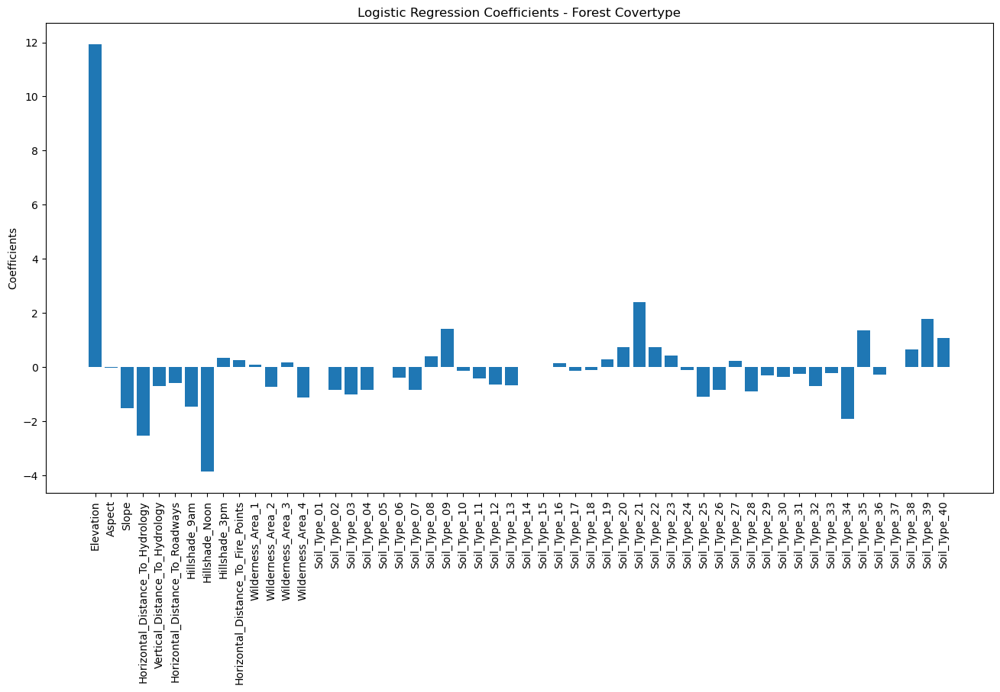

In [7]:
# show the coefficient value for each feature by a bar chart
def explain_logistic_regression(lr, feature_names):
    # --- Write your code below ---
    coefficients = lr.coef_
    fig, ax = plt.subplots()
    ax.bar(feature_names, coefficients[0], width=0.8)
    ax.set_ylabel('Coefficients')
    ax.set_title('Logistic Regression Coefficients - Forest Covertype')
    plt.xticks(rotation=90)
    plt.show()

# explain the model
explain_logistic_regression(lr, feature_names)

For a specific prediction, we can get a more concrete effect of each feature by the product of the coefficient and input feature value. Please follow the comment to finish the code:

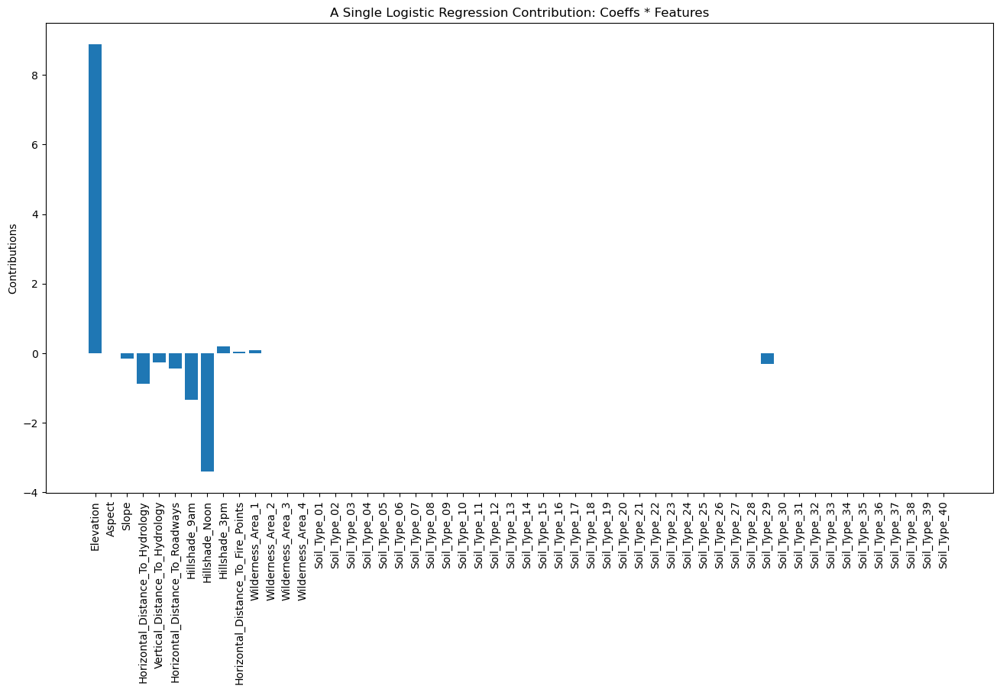

In [8]:
# show the effect from each input feature by a bar chart
def explain_logistic_regression_prediction(lr, feature_names, sample):
    # --- Write your code below ---
    coefficients = lr.coef_
    contributions = sample[0] * coefficients[0]
    fig, ax = plt.subplots()
    ax.bar(feature_names, contributions, width=0.8)
    ax.set_ylabel('Contributions')
    ax.set_title('A Single Logistic Regression Contribution: Coeffs * Features')
    plt.xticks(rotation=90)
    plt.show()
    
explain_logistic_regression_prediction(lr, feature_names, (X_test.iloc[0, :], y_test.iloc[0]))

What can you get from the above plots? Please write down two findings:

**Findings:**
1. Elevation, with a coefficient of 11.93, dominates the prediction made by the model. We see in the prediction that the contribution has a magnitude above 8, which is more than twice any other feature.
2. Early morning hillshade, particularly Hillshade_Noon, but to a lesser extent Hillshade_9am, are also fairly important features for the model. We see in the actual prediction that Hillshade_Noon has a magnitude approaching 4, which is comparatively high to all other features aside from elevation.

## Task 2. Post-hoc Explanation (Global Model)

In this task, you are going to build a gradient boosting tree model and a neural network, and use some techniques we introduced in class to interpret these models. First, let's train the models using training data:

In [9]:
# train a gradient boosting classifier
gb = GradientBoostingClassifier().fit(X_train, y_train)

In [10]:
# train a multi-layer perceptron classifier
mlp = MLPClassifier(learning_rate_init=0.1).fit(X_train, y_train)

### 2.1 Permutation

In [11]:
X_train.to_numpy().shape

(39611, 54)

/Users/MichaelKuby/miniconda3/envs/dataPrep/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
/Users/MichaelKuby/miniconda3/envs/dataPrep/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
/Users/MichaelKuby/miniconda3/envs/dataPrep/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
/Users/MichaelKuby/miniconda3/envs/dataPrep/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
/Users/MichaelKuby/miniconda3/envs/dataPrep/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X doe

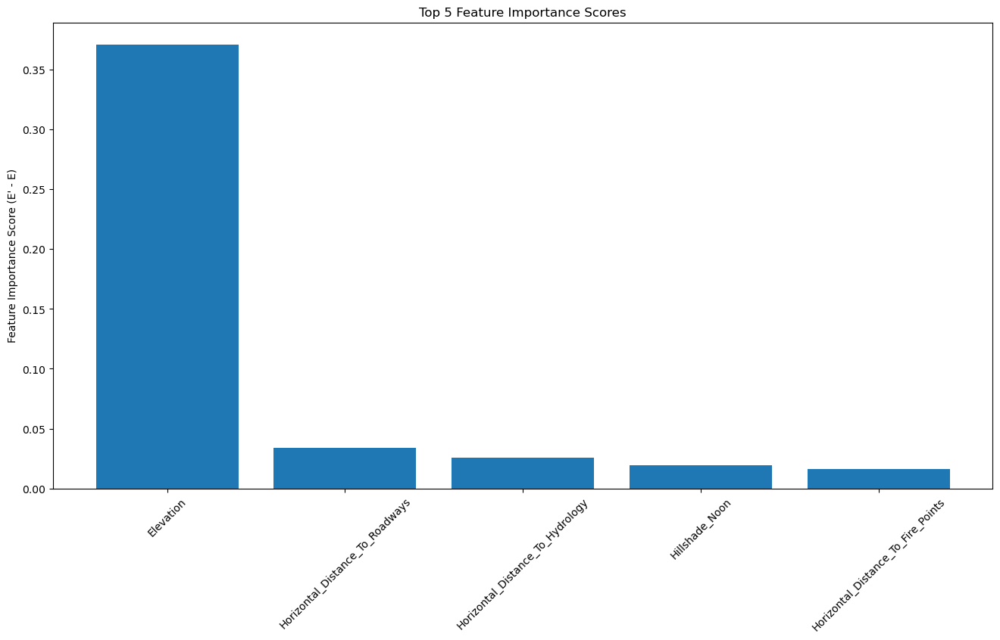

/Users/MichaelKuby/miniconda3/envs/dataPrep/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/Users/MichaelKuby/miniconda3/envs/dataPrep/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/Users/MichaelKuby/miniconda3/envs/dataPrep/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/Users/MichaelKuby/miniconda3/envs/dataPrep/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/Users/MichaelKuby/miniconda3/envs/dataPrep/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier wa

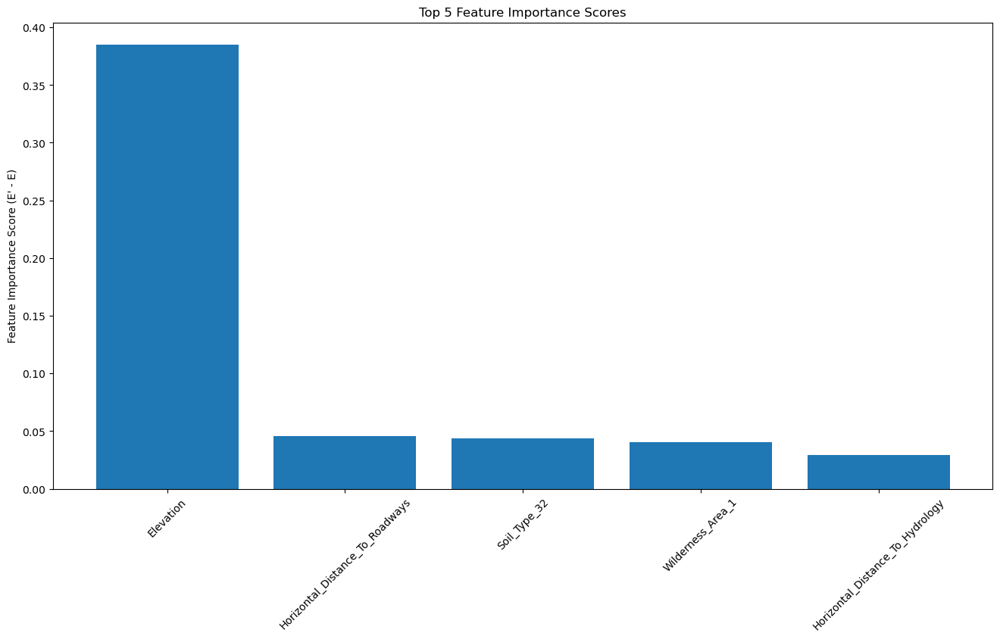

In [12]:
## get importance score (E' - E) for each feature by permutation, use log_loss as error
def permutation_importance(model, feature_names, X, y):
    # calculate importance score for each feature by permutation approach
    # --- Write your code below ---

    # Get evalutation scores from the original dataset
    originalPredictions = model.predict_proba(X)
    E = log_loss(y, originalPredictions)
    
    # Create a results list for the importance scores
    importanceScores = []
    iterations = 1
    
    for i in range(X.shape[-1]):
        Eprime = 0
        for _ in range(iterations):
            temp_X = X.copy()
            temp_X[:, i] = np.random.permutation(X[:, i])
            permutedPredictions = model.predict_proba(temp_X)
            this_Eprime = log_loss(y, permutedPredictions)
            Eprime += this_Eprime
            # Compute E' - E where E' is an average over the iterations
        importanceScores.append((Eprime / iterations) - E)

    # Create the DataFrame
    importanceScoresDF = pd.DataFrame(importanceScores, index=feature_names, columns=['Feature Importance Score'])
    importanceScoresDF = importanceScoresDF.sort_values(by='Feature Importance Score', ascending=False)
    # print(importanceScoresDF)

    # show the top 5 most important features
    # --- Write your code below ---
    top5 = importanceScoresDF.head(5)
    fig, ax = plt.subplots()
    ax.bar(top5.index, top5['Feature Importance Score'], width=0.8)
    ax.set_ylabel('Feature Importance Score (E\' - E)')
    ax.set_title('Top 5 Feature Importance Scores')
    plt.xticks(rotation=45)
    plt.show()

permutation_importance(gb, feature_names, X_test.to_numpy(), y_test.to_numpy())
permutation_importance(mlp, feature_names, X_test.to_numpy(), y_test.to_numpy()) 

### 2.2 Partial dependence plots

In this section, you are going to use the [plot_partial_dependence](https://scikit-learn.org/stable/modules/generated/sklearn.inspection.plot_partial_dependence.html#sklearn.inspection.plot_partial_dependence) provided by sklearn to see the marginal effect of each single numerical features:

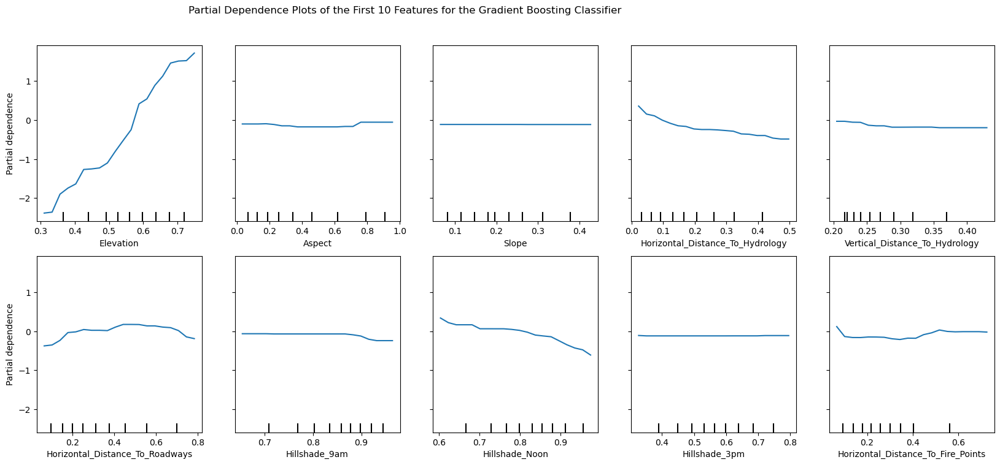

In [13]:
# plot partial dependence for numerical features (first 10 features) for gradient boosting classifier
# --- Write your code below ---
fig, ax = plt.subplots(figsize=(16,8))

display = PartialDependenceDisplay.from_estimator(
    gb,
    X_train,
    features = [i for i in range(10)],
    feature_names=X_train.columns[:10],
    n_cols=5,
    ax=ax,
    grid_resolution=20
)

plt.subplots_adjust(top=0.9, right=1.1)  # Adjust layout to make room for the title if necessary
plt.suptitle("Partial Dependence Plots of the First 10 Features for the Gradient Boosting Classifier")
plt.show()

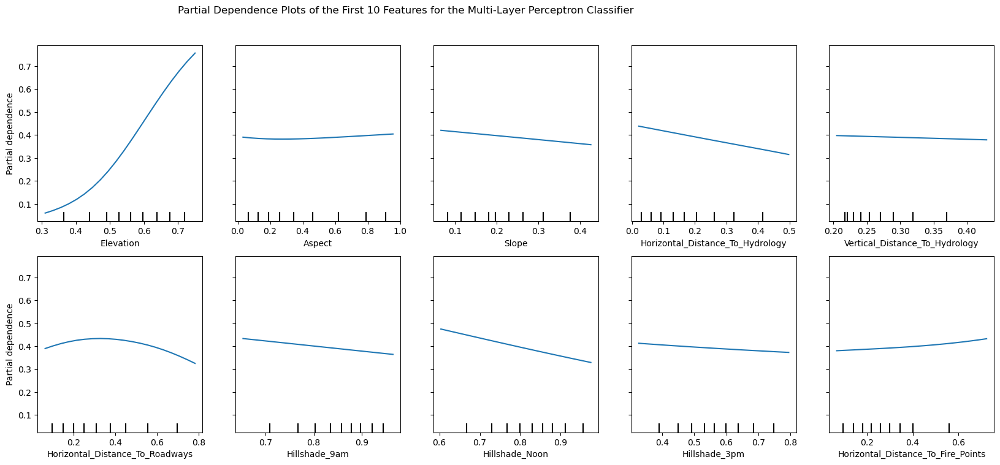

In [14]:
# plot partial dependence for numerical features (first 10 features) for neural network
# --- Write your code below ---
fig, ax = plt.subplots(figsize=(16,8))

display = PartialDependenceDisplay.from_estimator(
    mlp,
    X_train,
    features = [i for i in range(10)],
    feature_names=X_train.columns[:10],
    n_cols=5,
    ax=ax,
    grid_resolution=20
)

plt.subplots_adjust(top=0.9, right=1.1)  # Adjust layout to make room for the title if necessary
plt.suptitle("Partial Dependence Plots of the First 10 Features for the Multi-Layer Perceptron Classifier")
plt.show()

### 2.3 Global Surrogate

Now, let's train a simple logistic regression based on the gradient boosting tree model and neural network we built before. And use the method we implemented previously to interpret the derived transparent model:

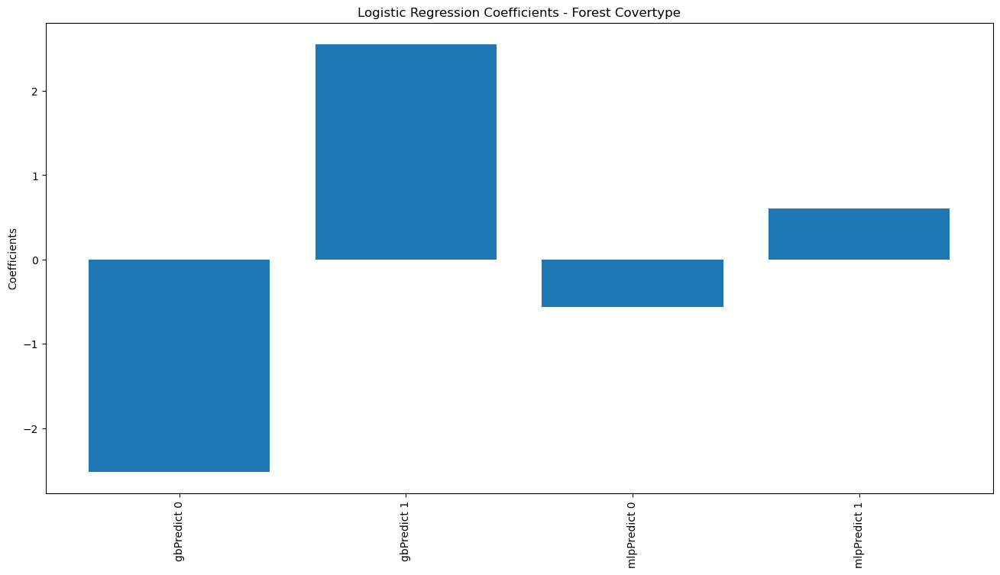

In [15]:
# train a logistic regression model on gb and mlp and explain using explain_logistic_regression()

# --- Write your code below ---

# Get the predictions from gb and mlp
gbPredictions = gb.predict_proba(X_train)
mlpPredictions = mlp.predict_proba(X_train)
X_train_surrogate = np.hstack((gbPredictions, mlpPredictions))

# Train a logistic regression model on gb and mlp predictions
globSurrLogRegModel = LogisticRegression(solver='liblinear').fit(X_train_surrogate, y_train)
surrogate_feature_names = ['gbPredict 0', 'gbPredict 1', 'mlpPredict 0', 'mlpPredict 1']

# Interpret the global surrogate using explain_logistic_regression()# explain the model
explain_logistic_regression(globSurrLogRegModel, surrogate_feature_names)


## Task 3. Post-hoc Explanation (Single Prediction)

### 3.1 Attribution

From now, let's focus on interpreting single predictions. [SHAP](https://github.com/slundberg/shap) is an efficient method to approximately calculate the shapely value we mentioned in class. Please install the library and take a look at the doc. Explain the first prediction made by the gradient boosting tree model in the test set:

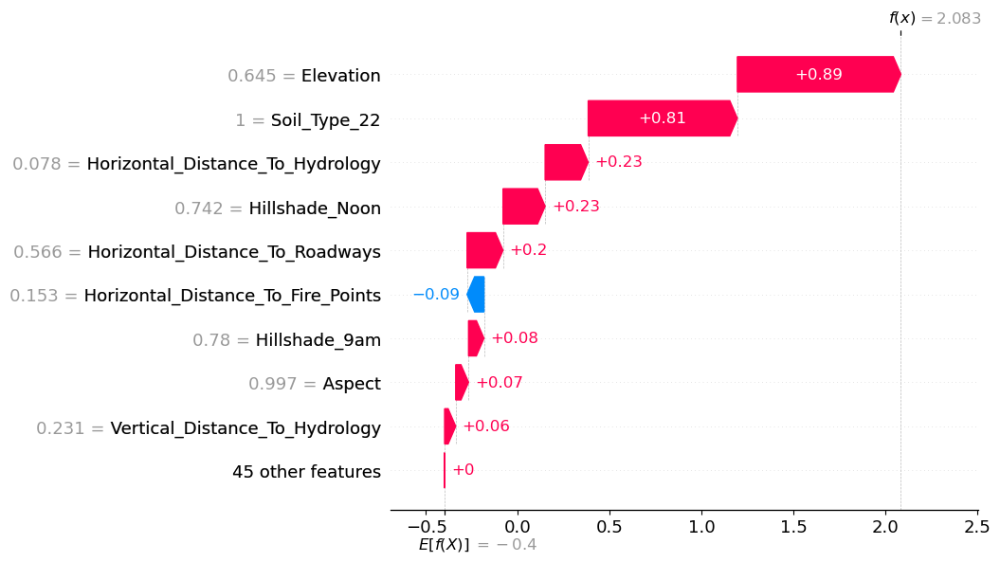

In [16]:
import shap

# load JS visualization code to notebook
shap.initjs()

# use Tree SHAP explainer to explain the gradient boosting tree model
# you only need to explain and plot the first explaination
# --- Write your code below ---

# explain the model's predictions using SHAP
explainer = shap.Explainer(gb)
shap_values = explainer(X_train)

# visualize the first prediction's explanation
shap.plots.waterfall(shap_values[0])

# visualize the first prediction's explanation with a force plot
shap.plots.force(shap_values[0])

What can you get from the above representation? Please write down two findings:

**Findings:**
1. We can see that the four main "drivers" of the Shapley value are Elevation, Soil_Type_22, Horizontal_Distance_To_Hydrology, and Hillshade_Noon. Some of this aligns with what we saw when analyzing the coefficients in that the Elevation and Hillshade_Noon were dominant positive contributors.
2. Surprisingly, Soil_Type_22, which looked to have a relatively modest contribution when analyzing the coefficients of the model, explain increases in the Shapley value to nearly the same degree as Elevation.

### 3.2 LIME

[LIME](https://github.com/marcotcr/lime) is a library implemented by the authors of the paper. Please install the library and take a look at the doc and tutorial. Use it to explain the first prediction made by the neural network model in the test set:

In [18]:
X_train

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type_31,Soil_Type_32,Soil_Type_33,Soil_Type_34,Soil_Type_35,Soil_Type_36,Soil_Type_37,Soil_Type_38,Soil_Type_39,Soil_Type_40
0,0.645376,0.997222,0.229508,0.078488,0.231383,0.565627,0.779528,0.742138,0.598425,0.153254,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.635396,0.230556,0.196721,0.111192,0.242021,0.536818,0.933071,0.773585,0.433071,0.421274,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.562874,0.108333,0.327869,0.224564,0.244681,0.690135,0.854331,0.610063,0.401575,0.432050,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.622089,0.972222,0.213115,0.170058,0.247340,0.543845,0.767717,0.767296,0.629921,0.146956,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.742515,0.638889,0.131148,0.127180,0.215426,0.182968,0.818898,0.955975,0.692913,0.186424,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39606,0.642049,0.852778,0.114754,0.138081,0.246011,0.132378,0.791339,0.886792,0.688976,0.195801,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
39607,0.386560,0.102778,0.163934,0.194767,0.277926,0.238477,0.866142,0.779874,0.523622,0.050525,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
39608,0.604790,0.172222,0.180328,0.061773,0.224734,0.419056,0.905512,0.761006,0.464567,0.791463,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
39609,0.356620,0.152778,0.327869,0.130814,0.243351,0.030354,0.897638,0.616352,0.354331,0.038768,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


/Users/MichaelKuby/miniconda3/envs/dataPrep/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


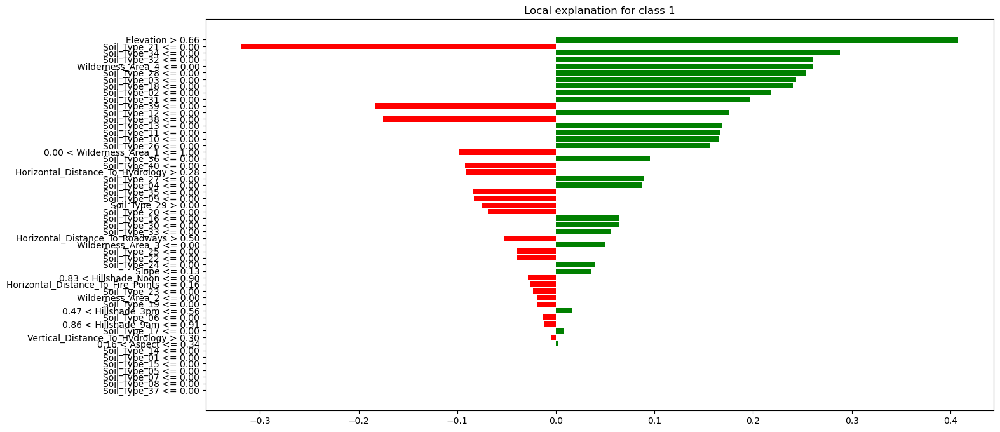

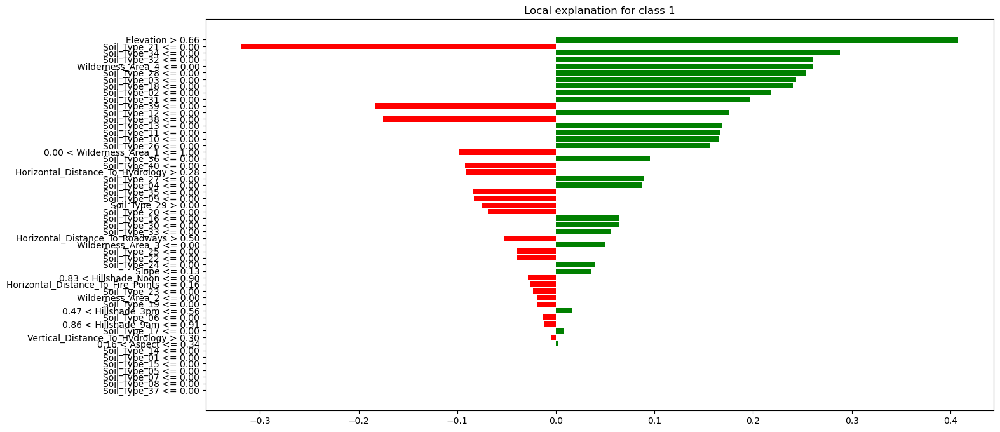

In [32]:
import lime.lime_tabular

# use LimeTabularExplainer to explain the neural network model
# you only need to explain and plot the first explanation
# --- Write your code below ---

# Create the explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.to_numpy(), feature_names=feature_names, discretize_continuous=True)

# Explain the first explanation
explanationObj = explainer.explain_instance(X_test.iloc[0], mlp.predict_proba, num_features=X_test.shape[-1])

# Plot using pyplot
explanationObj.as_pyplot_figure()

/Users/MichaelKuby/miniconda3/envs/dataPrep/lib/python3.11/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


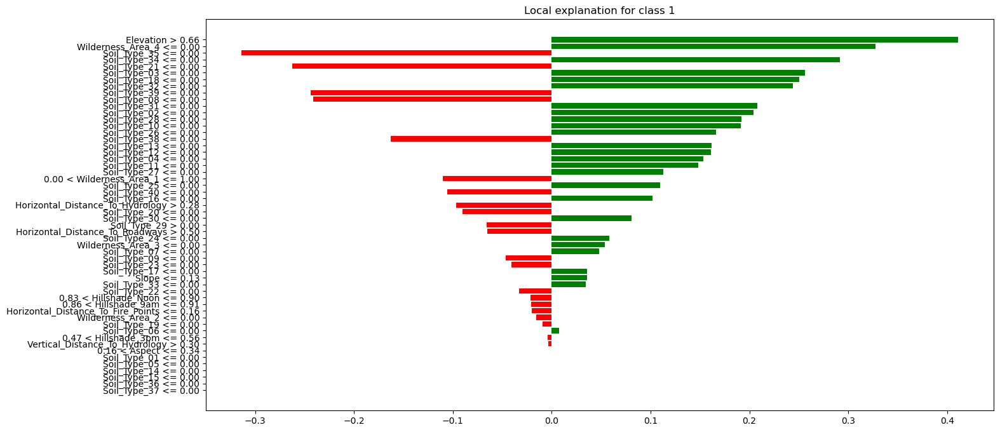

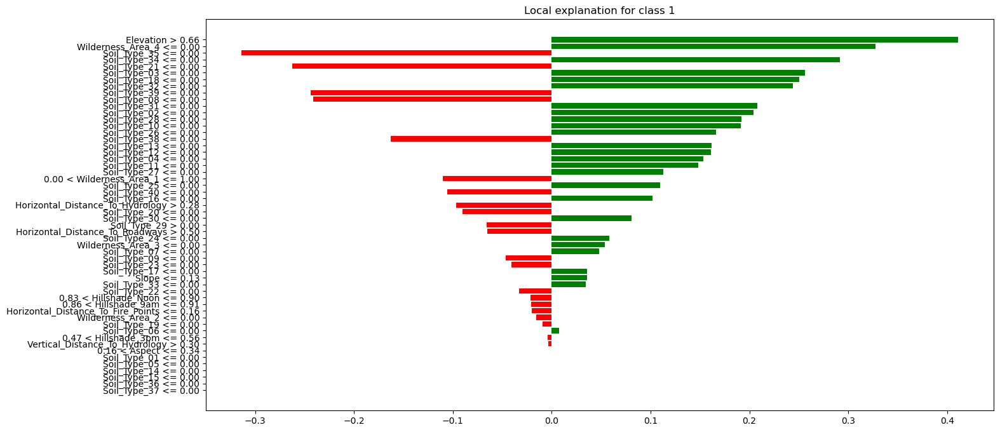

In [33]:
import lime.lime_tabular

# use LimeTabularExplainer to explain the neural network model
# you only need to explain and plot the first explanation
# --- Write your code below ---

# Create the explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.to_numpy(), feature_names=feature_names, discretize_continuous=True)

# Explain the first explanation
explanationObj = explainer.explain_instance(X_test.iloc[0], mlp.predict_proba, num_features=X_test.shape[-1])

# Plot using pyplot
explanationObj.as_pyplot_figure()

Run LIME multiple times, (Q1) what do you think of the stability of LIME? (Q2) Can you briefly explain the reason?

**Your Answer:** 
1. LIME clearly produces different results for each explanation it produces; however, it does seem to highlight the dominant features with a fair degree of consistency. It is clear, though, that there are variations in the explanations generated for the same prediction by the same model. 
2. The instability has to do with how LIME generates it's explanations. LIME produces perturbations of the instance of interest and generates a new dataset of samples. These are then used to test what happens to the prediction when given the model is given the variations of data. Since the perturbations will be randomized, so will our results.

## Submission
Complete the code in this notebook, and submit it to the CourSys activity Assignment 8.